### Problem: AI Edit Scene Classifier
### Evaluated On: Multi Class Log Loss
### This is built using TensorFlow and TensorFlow Hub.

### Import Packages

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import os
from IPython.display import Image
import numpy as np
from sklearn.model_selection import train_test_split
import tf_keras as tfk
import datetime
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

import sys
sys.path.append("/content/drive/My Drive/Edit Scene Classifier/utility")
import helpers as hlp

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Mount Drive
### Set Path containing Utility functions
### Check for GPU Availability

In [2]:
hlp.check_gpu()

GPU available (YES!!!!)


### Get Data Ready by turning into Tensors


### Get images and their labels

In [3]:
labels_csv = pd.read_csv("drive/MyDrive/Edit Scene Classifier/train.csv")
print(labels_csv.describe())
print(labels_csv.head())

          image label
count       720   720
unique      720     2
top     877.jpg  real
freq          1   405
   image    label
0  1.jpg  editada
1  2.jpg     real
2  3.jpg     real
3  6.jpg  editada
4  8.jpg     real


### Prepare Data

In [4]:
# Get image names and set Path Name.
filenames = ["drive/MyDrive/Edit Scene Classifier/train/" + fname for fname in labels_csv["image"]]
filenames[:10]

['drive/MyDrive/Edit Scene Classifier/train/1.jpg',
 'drive/MyDrive/Edit Scene Classifier/train/2.jpg',
 'drive/MyDrive/Edit Scene Classifier/train/3.jpg',
 'drive/MyDrive/Edit Scene Classifier/train/6.jpg',
 'drive/MyDrive/Edit Scene Classifier/train/8.jpg',
 'drive/MyDrive/Edit Scene Classifier/train/9.jpg',
 'drive/MyDrive/Edit Scene Classifier/train/10.jpg',
 'drive/MyDrive/Edit Scene Classifier/train/11.jpg',
 'drive/MyDrive/Edit Scene Classifier/train/12.jpg',
 'drive/MyDrive/Edit Scene Classifier/train/13.jpg']

In [5]:
# Get Labels
scene_labels = labels_csv["label"].to_numpy()

scene_labels[:10]

array(['editada', 'real', 'real', 'editada', 'real', 'editada', 'editada',
       'editada', 'real', 'editada'], dtype=object)

### Validate Data

In [6]:
# Validate filenames with images provided
if len(os.listdir("drive/MyDrive/Edit Scene Classifier/train/")) == len(filenames):
  print("All images are available")
else:
  print("Not all images are available")

All images are available


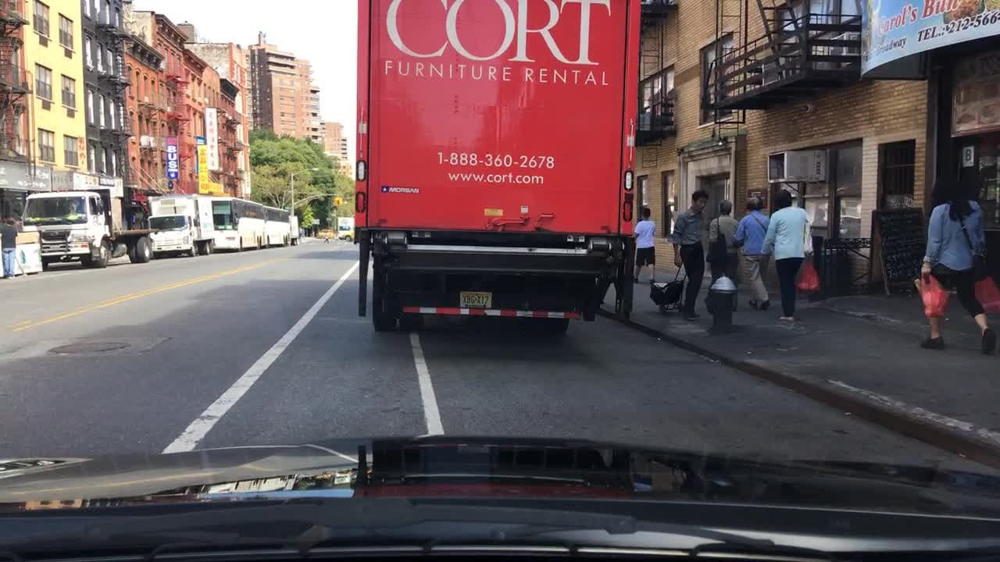

In [7]:
# Check data
Image(filenames[4])

In [8]:
# Validate Image Labels with File names
if len(scene_labels) == len(filenames):
  print("All labels are available")
else:
  print("Not all labels are available")

All labels are available


In [9]:
# Find Unique Labels
unique_scenes = np.unique(scene_labels)
unique_scenes

array(['editada', 'real'], dtype=object)

### Convert Labels to boolean

In [10]:
boolean_labels = [label == unique_scenes for label in scene_labels]

### Due to large test dataset, take a subset of training data and create Test and Validation set for trial.

In [11]:
X = filenames
y = boolean_labels

In [12]:
NUM_IMAGES = 450 #@param {type : "slider", min:450, max:1000, step:10}


In [13]:
# Split 80% of data for training and 20% for validation set
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

### Create Training and Validation data into Batches

In [14]:
BATCH_SIZE=32
train_data_batches = hlp.create_data_batches(X_train,BATCH_SIZE, y_train)
validation_data_batches = hlp.create_data_batches(X_val,BATCH_SIZE, y_val,validation_data=True)

Creating training data batches...
Creating validation data batches...


### Load Pretrained model build for our requirements

In [15]:
# INPUT_SHAPE = [batch, height, width, color channels]
# Set Image Size
IMG_SIZE = 224
COLOR_CHANNELS = 3
INPUT_SHAPE= [None, IMG_SIZE, IMG_SIZE, COLOR_CHANNELS]
# OUTPUT_SHAPE OF MODEL
OUTPUT_SHAPE = len(unique_scenes)
# MODEL URL
MODEL_URL = "https://tfhub.dev/google/imagenet/resnet_v2_152/feature_vector/5"

In [16]:
model = hlp.create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL)
model.summary()

Building model with: https://tfhub.dev/google/imagenet/resnet_v2_152/feature_vector/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 2048)              58331648  
                                                                 
 dense (Dense)               (None, 2)                 4098      
                                                                 
Total params: 58335746 (222.53 MB)
Trainable params: 4098 (16.01 KB)
Non-trainable params: 58331648 (222.52 MB)
_________________________________________________________________


In [ ]:
#from tensorflow.keras.utils import plot_model
#plot_model(model, show_shapes=True, show_layer_names=True)

In [17]:
# Set Callback parameters
early_stopping = tfk.callbacks.EarlyStopping(monitor="val_accuracy",
                                             patience=3)
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

### Train Model

In [18]:
model = hlp.train_model(model,train_data_batches,NUM_EPOCHS, validation_data_batches,early_stopping)

Training model...
Epoch 1/100
12/12 [==============================] - 63s 3s/step - loss: 0.8414 - accuracy: 0.4889 - val_loss: 0.7372 - val_accuracy: 0.4556
Epoch 2/100
12/12 [==============================] - 4s 325ms/step - loss: 0.7041 - accuracy: 0.5889 - val_loss: 0.7616 - val_accuracy: 0.4667
Epoch 3/100
12/12 [==============================] - 4s 282ms/step - loss: 0.6293 - accuracy: 0.6556 - val_loss: 0.7631 - val_accuracy: 0.5000
Epoch 4/100
12/12 [==============================] - 5s 430ms/step - loss: 0.5787 - accuracy: 0.7000 - val_loss: 0.7361 - val_accuracy: 0.5444
Epoch 5/100
12/12 [==============================] - 4s 330ms/step - loss: 0.5489 - accuracy: 0.7417 - val_loss: 0.7567 - val_accuracy: 0.5333
Epoch 6/100
12/12 [==============================] - 4s 333ms/step - loss: 0.5094 - accuracy: 0.7472 - val_loss: 0.7693 - val_accuracy: 0.4778
Epoch 7/100
12/12 [==============================] - 5s 395ms/step - loss: 0.4901 - accuracy: 0.7639 - val_loss: 0.7795 - val_

In [19]:
## TensorBoard Callback
%load_ext tensorboard
### Checking the TensorBoard logs
%tensorboard --logdir drive/MyDrive/Edit\ Scene\ Classifier/logs

Output hidden; open in https://colab.research.google.com to view.

### Make Predictions on the Validation Data

In [20]:
predictions = model.predict(validation_data_batches, verbose=1)
len(predictions)

3/3 [==============================] - 2s 278ms/step


90

In [21]:
validation_images, validation_labels = hlp.unbatchify(unique_scenes,validation_data_batches)

In [22]:
#validation_images[0], validation_labels[0]
len(validation_images), len(validation_labels)

(90, 90)

### Function plotting prediction Probability, Label and Image

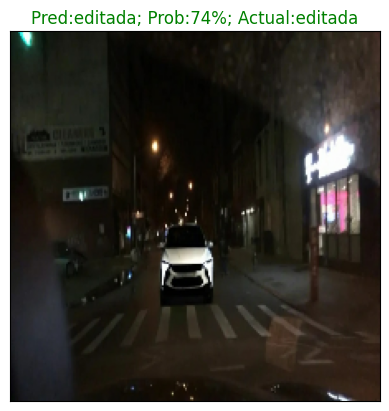

In [23]:
hlp.plot_pred(unique_scenes, prediction_probabilities=predictions,
          labels=validation_labels,
          images=validation_images,
          n=89)

### Function to view top 10 predictions

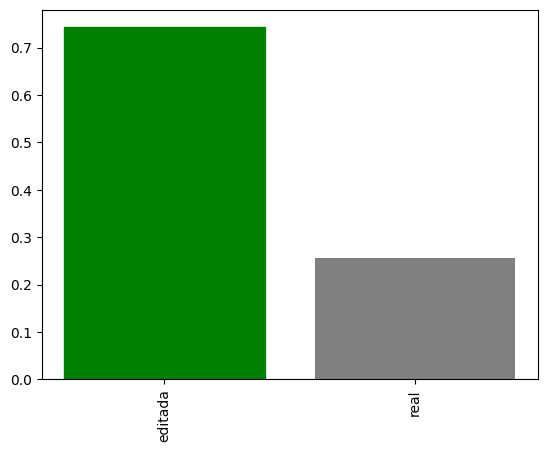

In [24]:
hlp.plot_pred_conf(unique_scenes,prediction_probabilities=predictions,labels=validation_labels,n=89)

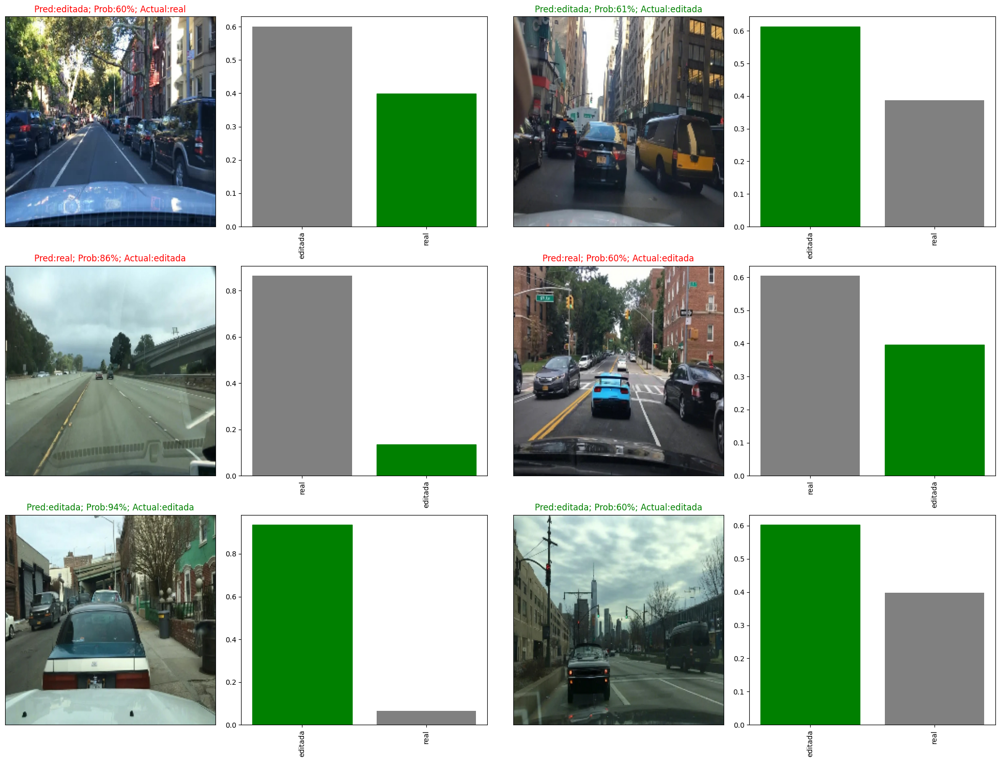

In [25]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  hlp.plot_pred(unique_scenes,
                prediction_probabilities=predictions,
                labels=validation_labels,
                images=validation_images,
                n=i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  hlp.plot_pred_conf(unique_scenes,
                    prediction_probabilities=predictions,
                    labels=validation_labels,
                    n=i + i_multiplier)
  plt.tight_layout(h_pad=1.0)
  i_multiplier += len(validation_labels) // (len(unique_scenes) * num_images)
plt.show()

### Save Model

In [26]:
# Save our model
MODEL_DIR_PATH = "drive/MyDrive/Edit Scene Classifier/models"
hlp.save_model(MODEL_DIR_PATH,model, suffix="resnet_v2_152-90-images-Adam")

Saving model to: drive/MyDrive/Edit Scene Classifier/models/20250510-223315-resnet_v2_152-90-images-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Edit Scene Classifier/models/20250510-223315-resnet_v2_152-90-images-Adam.h5'

### Load Model

In [27]:
loaded_90_image_model = hlp.load_model('drive/MyDrive/Edit Scene Classifier/models/20250510-223315-resnet_v2_152-90-images-Adam.h5')

Loading saved model from: drive/MyDrive/Edit Scene Classifier/models/20250510-223315-resnet_v2_152-90-images-Adam.h5


### Evaluate the pre-saved model

In [28]:
model.evaluate(validation_data_batches)

3/3 [==============================] - 1s 193ms/step - loss: 0.7795 - accuracy: 0.4667


[0.7794966101646423, 0.46666666865348816]

In [29]:
loaded_90_image_model.evaluate(validation_data_batches)

3/3 [==============================] - 3s 197ms/step - loss: 0.7795 - accuracy: 0.4667


[0.7794966101646423, 0.46666666865348816]

### Training a model on the full data

In [30]:
# Create a data batch with full data set
full_data_batches = hlp.create_data_batches(X,BATCH_SIZE, y)

Creating training data batches...


In [31]:
# No validation set when training on all the data
full_model_early_stopping = tfk.callbacks.EarlyStopping(monitor="accuracy",
                                                      patience=3)
model = hlp.create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL)
full_model = hlp.train_full_model(model,full_data_batches,NUM_EPOCHS,full_model_early_stopping)

Building model with: https://tfhub.dev/google/imagenet/resnet_v2_152/feature_vector/5
Training Full model...
Epoch 1/100
23/23 [==============================] - 19s 264ms/step - loss: 0.8546 - accuracy: 0.5181
Epoch 2/100
23/23 [==============================] - 7s 291ms/step - loss: 0.6847 - accuracy: 0.5986
Epoch 3/100
23/23 [==============================] - 5s 221ms/step - loss: 0.6299 - accuracy: 0.6569
Epoch 4/100
23/23 [==============================] - 7s 279ms/step - loss: 0.5761 - accuracy: 0.6875
Epoch 5/100
23/23 [==============================] - 6s 256ms/step - loss: 0.5577 - accuracy: 0.7069
Epoch 6/100
23/23 [==============================] - 7s 295ms/step - loss: 0.5302 - accuracy: 0.7306
Epoch 7/100
23/23 [==============================] - 5s 228ms/step - loss: 0.5025 - accuracy: 0.7542
Epoch 8/100
23/23 [==============================] - 5s 219ms/step - loss: 0.4781 - accuracy: 0.7861
Epoch 9/100
23/23 [==============================] - 7s 290ms/step - loss: 0.4641 

### Save Full Model

In [32]:
# Save our model
MODEL_DIR_PATH = "drive/MyDrive/Edit Scene Classifier/models"
hlp.save_model(MODEL_DIR_PATH,full_model, suffix="resnet_v2_152-full-images-Adam")

Saving model to: drive/MyDrive/Edit Scene Classifier/models/20250510-224148-resnet_v2_152-full-images-Adam.h5...


'drive/MyDrive/Edit Scene Classifier/models/20250510-224148-resnet_v2_152-full-images-Adam.h5'

### Load the full model


In [33]:
loaded_full_image_model = hlp.load_model('drive/MyDrive/Edit Scene Classifier/models/20250510-224148-resnet_v2_152-full-images-Adam.h5')

Loading saved model from: drive/MyDrive/Edit Scene Classifier/models/20250510-224148-resnet_v2_152-full-images-Adam.h5


### Make Predictions on Test Data Set

In [34]:
# 1 Get the test image file names
# 2 Convert the filnames into test data batches using create_data_batches
# 3 Make a predictions array by passing the test batches to the predict() method called on our model

# Load test image file names
test_path = "drive/MyDrive/Edit Scene Classifier/test/"
test_filenames = [test_path + fname for fname in sorted(os.listdir(test_path),key=hlp.numeric_sort_key)]
test_filenames[0]

'drive/MyDrive/Edit Scene Classifier/test/4.jpg'

In [35]:
test_filenames[:10]

['drive/MyDrive/Edit Scene Classifier/test/4.jpg',
 'drive/MyDrive/Edit Scene Classifier/test/5.jpg',
 'drive/MyDrive/Edit Scene Classifier/test/7.jpg',
 'drive/MyDrive/Edit Scene Classifier/test/21.jpg',
 'drive/MyDrive/Edit Scene Classifier/test/24.jpg',
 'drive/MyDrive/Edit Scene Classifier/test/32.jpg',
 'drive/MyDrive/Edit Scene Classifier/test/33.jpg',
 'drive/MyDrive/Edit Scene Classifier/test/39.jpg',
 'drive/MyDrive/Edit Scene Classifier/test/42.jpg',
 'drive/MyDrive/Edit Scene Classifier/test/46.jpg']

### Create Test Data Batches

In [37]:
# Create test data batch
test_data = hlp.create_data_batches(test_filenames, BATCH_SIZE, test_data=True)

Creating test data batches...


### Make predictions on test data batch using the loaded full model

In [38]:
test_predictions = loaded_full_image_model.predict(test_data,
                                                    verbose=1)

6/6 [==============================] - 16s 538ms/step


# Save predictions (NumPy array) to CSV to access later

In [39]:
np.savetxt("drive/MyDrive/Edit Scene Classifier/test_predictions_array.csv", test_predictions, delimiter=",")

### Load predictions (NumPy array) from csv file

In [40]:

test_predictions = np.loadtxt("drive/MyDrive/Edit Scene Classifier/test_predictions_array.csv", delimiter=",")

In [41]:
test_predictions[0]

array([0.04998223, 0.95001781])

### Preparing test data set predictions as per requirements

In [42]:
# Convert prediction probabilities to labels: 1 if 'real', 0 if 'fake'
labels = [1 if unique_scenes[np.argmax(row)] == 'real' else 0 for row in test_predictions]

# Get test image filenames (assumes images are in this folder)
image_names = sorted(os.listdir(test_path),key=hlp.numeric_sort_key)  # Sorted to match prediction order

# Create a DataFrame with image names and predicted labels
results_df = pd.DataFrame({
    'image': image_names,
    'label': labels
})

In [43]:
# Export to CSV
results_df.to_csv("drive/MyDrive/Edit Scene Classifier/full_model_predictions_submissions_1.csv", index=False)

### Make Predictions using Custom Images

In [44]:
# 1. Get filepaths of our own images.
# 2. Turn the filepaths into data batches and set it as Test
# 3. Pass the custom image data batch to predict method
# 4. Convert the prediction output probabilities to prediction labels
# 5. Compare the predicted labels to the custom images

import os
custom_path = "drive/MyDrive/Edit Scene Classifier/custom/"
custom_images = [custom_path + fname for fname in os.listdir(custom_path)]
custom_images

['drive/MyDrive/Edit Scene Classifier/custom/fractal_tree.jpg.jpg',
 'drive/MyDrive/Edit Scene Classifier/custom/premium_photo.jpg',
 'drive/MyDrive/Edit Scene Classifier/custom/Fake Image 1.jpg',
 'drive/MyDrive/Edit Scene Classifier/custom/Fake Image 2.jpg']

In [45]:
# Turn custom images into data batches
custom_data = hlp.create_data_batches(custom_images, BATCH_SIZE, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [46]:
custom_preds = loaded_full_image_model.predict(custom_data)
custom_preds.shape

1/1 [==============================] - 2s 2s/step


(4, 2)

In [47]:
# Get custom image prediction labels
custom_preds_labels = [hlp.get_prediction_label(unique_scenes,custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['real', 'real', 'real', 'real']

In [48]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


In [49]:
custom_images = np.array(custom_images)
custom_images.shape

(4, 224, 224, 3)

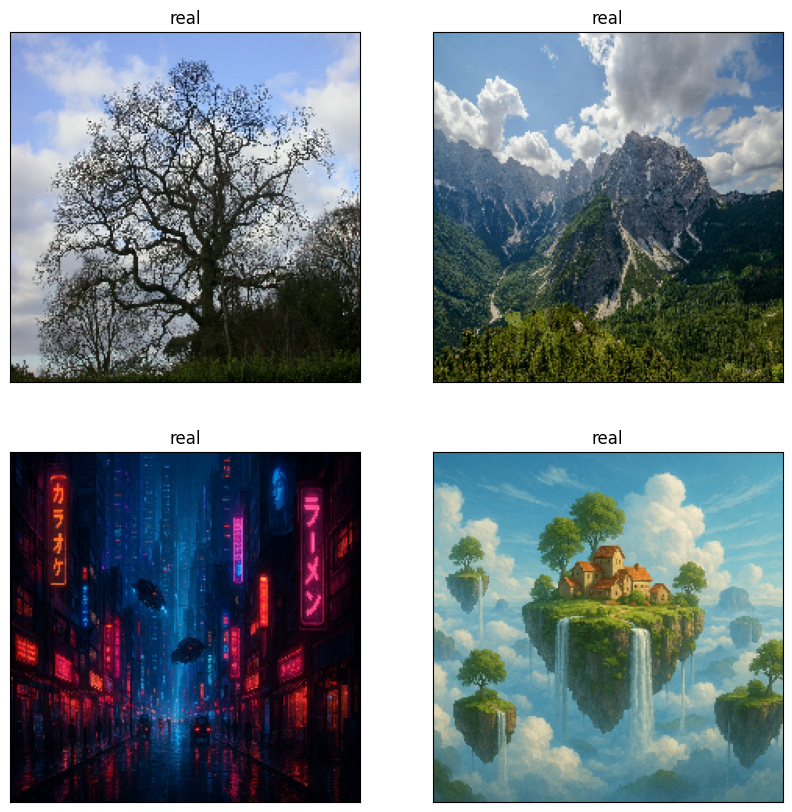

In [50]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(2, 2, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)
